# Importação das bibliotecas

In [2]:
# Manipulação dos dados
import pandas as pd
import numpy as np

# Visualização de dados
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

# Modelagem
# Validação
from sklearn.model_selection import train_test_split, StratifiedKFold

# Modelos
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression

# Feature importance
from sklearn.inspection import permutation_importance

# Encoders, imputers e criação de pipelines
from category_encoders import CatBoostEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline

# Métricas de desempenho
from sklearn.metrics import mean_squared_log_error, mean_absolute_error, mean_squared_error, r2_score

# Tunagem de hiperparâmetros
import optuna as opt

# Ocultar avisos
from warnings import filterwarnings
filterwarnings('ignore')

c:\Users\pschm\AppData\Local\Programs\Python\Python311\fccd\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Importação dos datasets

In [3]:
test = pd.read_csv(r'Dataset\test.csv')
train = pd.read_csv(r'Dataset\train.csv')
sample_submission = pd.read_csv(r'Dataset\sample_submission.csv')
display(test.head())
display(train.head())
display(sample_submission.head())

,id,Sex,Length,Diameter,Height,Whole weight,Whole weight.1,Whole weight.2,Shell weight
0,90615,M,0.645,0.475,0.155,1.2380,0.6185,0.3125,0.3005
1,90616,M,0.580,0.460,0.160,0.9830,0.4785,0.2195,0.2750
2,90617,M,0.560,0.420,0.140,0.8395,0.3525,0.1845,0.2405
3,90618,M,0.570,0.490,0.145,0.8740,0.3525,0.1865,0.2350
4,90619,I,0.415,0.325,0.110,0.3580,0.1575,0.0670,0.1050


,id,Sex,Length,Diameter,Height,Whole weight,Whole weight.1,Whole weight.2,Shell weight,Rings
0,0,F,0.550,0.430,0.150,0.7715,0.3285,0.1465,0.2400,11
1,1,F,0.630,0.490,0.145,1.1300,0.4580,0.2765,0.3200,11
2,2,I,0.160,0.110,0.025,0.0210,0.0055,0.0030,0.0050,6
3,3,M,0.595,0.475,0.150,0.9145,0.3755,0.2055,0.2500,10
4,4,I,0.555,0.425,0.130,0.7820,0.3695,0.1600,0.1975,9


,id,Rings
0,90615,10
1,90616,10
2,90617,10
3,90618,10
4,90619,10


In [4]:
train.columns

Index(['id', 'Sex', 'Length', 'Diameter', 'Height', 'Whole weight',
       'Whole weight.1', 'Whole weight.2', 'Shell weight', 'Rings'],
      dtype='object')

## Dicionário das variáveis

* **id**: Identificação única do animal
* **Sex**: Sexo (M, F e I para estágios iniciais)
* **Length**: Comprimento da concha
* **Diameter**: Diâmetro da concha
* **Height**: Altura
* **Whole weight**: Peso total, incluindo carne e a concha
* **Whole weight.1**: Peso apenas da carne extraída da concha
* **Whole weight.2**: Peso das vísceras da concha 
* **Shell weight**: Peso da concha
* **Ring**: Número de anéis presentes na concha, que serve como indicador da sua idade

# Análise exploratória inicial

In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90615 entries, 0 to 90614
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              90615 non-null  int64  
 1   Sex             90615 non-null  object 
 2   Length          90615 non-null  float64
 3   Diameter        90615 non-null  float64
 4   Height          90615 non-null  float64
 5   Whole weight    90615 non-null  float64
 6   Whole weight.1  90615 non-null  float64
 7   Whole weight.2  90615 non-null  float64
 8   Shell weight    90615 non-null  float64
 9   Rings           90615 non-null  int64  
dtypes: float64(7), int64(2), object(1)
memory usage: 6.9+ MB


In [6]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60411 entries, 0 to 60410
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              60411 non-null  int64  
 1   Sex             60411 non-null  object 
 2   Length          60411 non-null  float64
 3   Diameter        60411 non-null  float64
 4   Height          60411 non-null  float64
 5   Whole weight    60411 non-null  float64
 6   Whole weight.1  60411 non-null  float64
 7   Whole weight.2  60411 non-null  float64
 8   Shell weight    60411 non-null  float64
dtypes: float64(7), int64(1), object(1)
memory usage: 4.1+ MB


In [7]:
print(f'O dataframe de treinamento possui {train.shape[0]} linhas e {train.shape[1]} colunas.\nEnquanto o dataframe de teste possui {test.shape[0]} linhas e {test.shape[1]} colunas.')

O dataframe de treinamento possui 90615 linhas e 10 colunas.
Enquanto o dataframe de teste possui 60411 linhas e 9 colunas.


In [8]:
train.describe()

,id,Length,Diameter,Height,Whole weight,Whole weight.1,Whole weight.2,Shell weight,Rings
count,90615.000000,90615.000000,90615.000000,90615.000000,90615.000000,90615.000000,90615.000000,90615.000000,90615.000000
mean,45307.000000,0.517098,0.401679,0.135464,0.789035,0.340778,0.169422,0.225898,9.696794
std,26158.441658,0.118217,0.098026,0.038008,0.457671,0.204428,0.100909,0.130203,3.176221
min,0.000000,0.075000,0.055000,0.000000,0.002000,0.001000,0.000500,0.001500,1.000000
25%,22653.500000,0.445000,0.345000,0.110000,0.419000,0.177500,0.086500,0.120000,8.000000
50%,45307.000000,0.545000,0.425000,0.140000,0.799500,0.330000,0.166000,0.225000,9.000000
75%,67960.500000,0.600000,0.470000,0.160000,1.067500,0.463000,0.232500,0.305000,11.000000
max,90614.000000,0.815000,0.650000,1.130000,2.825500,1.488000,0.760000,1.005000,29.000000


#### Contagem de valores nulos

In [9]:
train.isnull().sum()

id                0
Sex               0
Length            0
Diameter          0
Height            0
Whole weight      0
Whole weight.1    0
Whole weight.2    0
Shell weight      0
Rings             0
dtype: int64

In [10]:
test.isnull().sum()

id                0
Sex               0
Length            0
Diameter          0
Height            0
Whole weight      0
Whole weight.1    0
Whole weight.2    0
Shell weight      0
dtype: int64

#### Contagem de valores nulos

In [11]:
display(train[train.duplicated])
display(test[test.duplicated])

,id,Sex,Length,Diameter,Height,Whole weight,Whole weight.1,Whole weight.2,Shell weight,Rings


,id,Sex,Length,Diameter,Height,Whole weight,Whole weight.1,Whole weight.2,Shell weight


## Análise univariada

Valores distintos para cada variável

In [12]:
count = pd.DataFrame(columns=['variavel', 'valores_unicos'])

for col in train.columns:
    dados = {'variavel': col, 'valores_unicos': train[col].value_counts().shape[0]}
    count = pd.concat([count, pd.DataFrame(dados, index=[0])], ignore_index=True)

count

,variavel,valores_unicos
0,id,90615
1,Sex,3
2,Length,157
3,Diameter,126
4,Height,90
5,Whole weight,3175
6,Whole weight.1,1799
7,Whole weight.2,979
8,Shell weight,1129
9,Rings,28


Gráfico de barras para a variável categórica

In [13]:
sex_counts = train['Sex'].value_counts().reset_index()
sex_counts.columns = ['sex', 'contagem']

fig = px.bar(sex_counts, x = 'sex', y = 'contagem', color = 'sex',
            title = 'Distribuição por sexo', text = 'contagem',
            labels = {'contagem': 'Número de indivíduos', 'sex': 'Sexo'})
fig.update_traces(textposition = 'outside', texttemplate = '%{text}', 
                  textfont_size = 12)
fig.update_yaxes(showticklabels=False)

fig.show() 

Histograma e box plot para variáveis numéricas

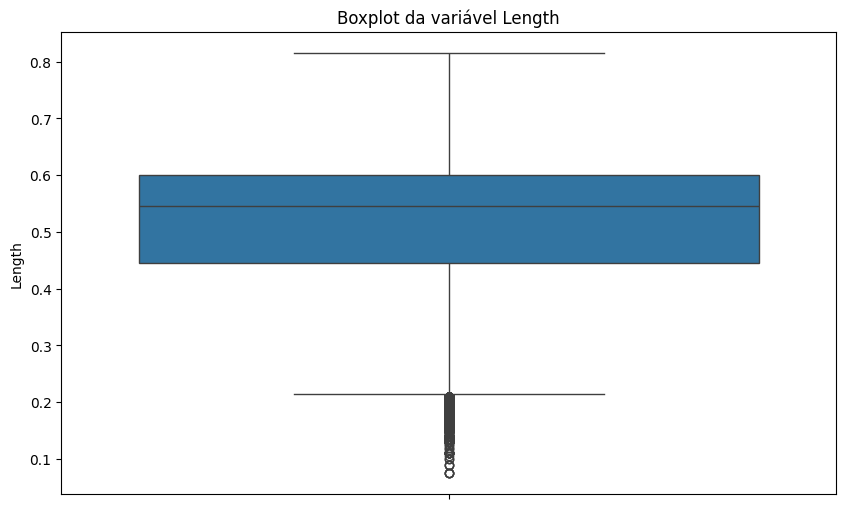

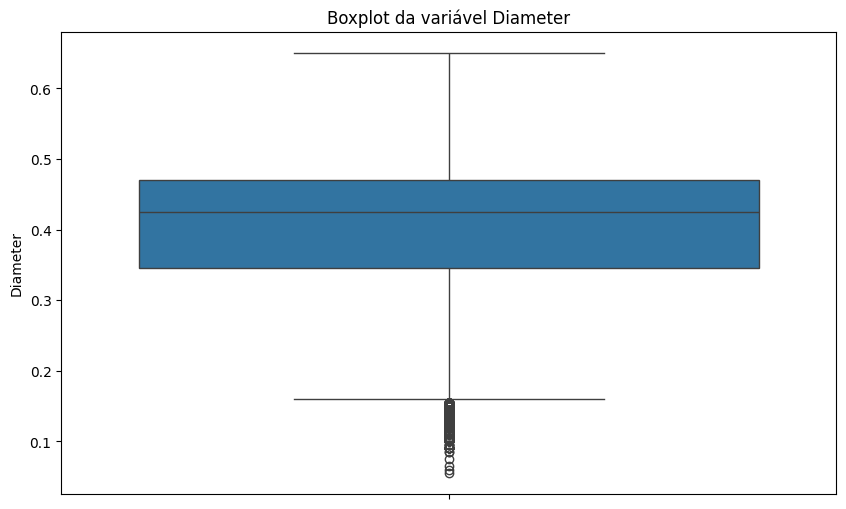

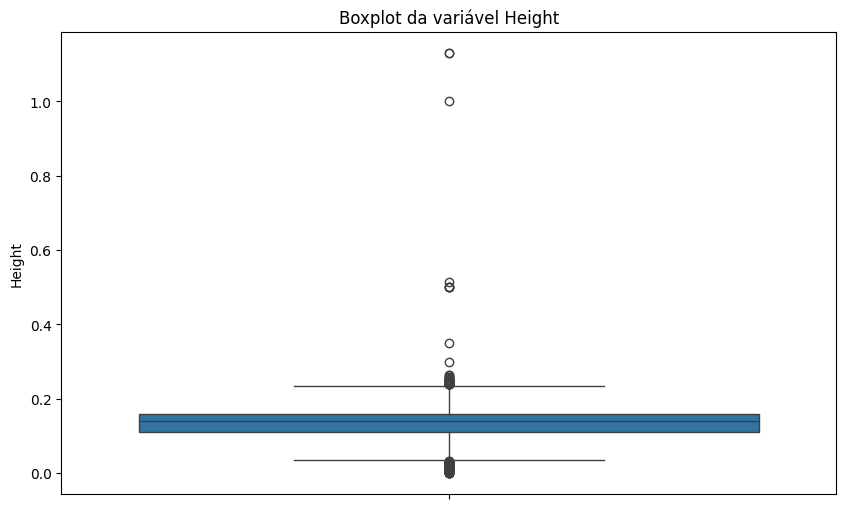

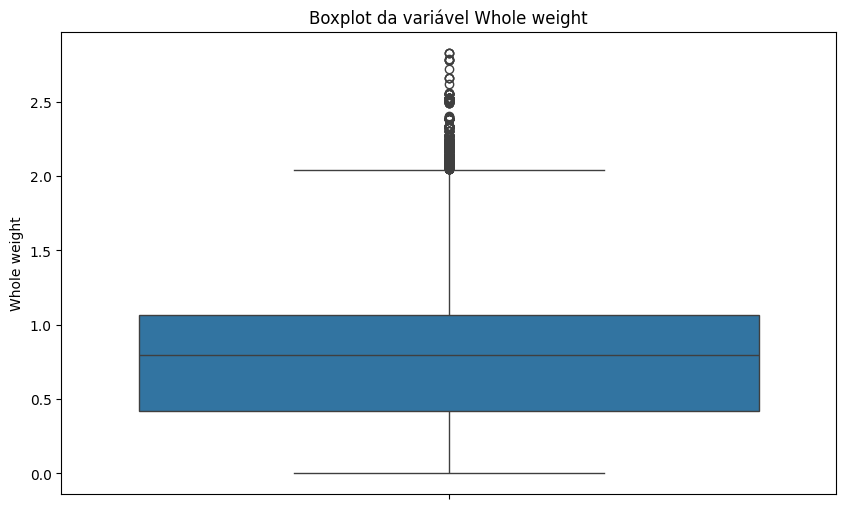

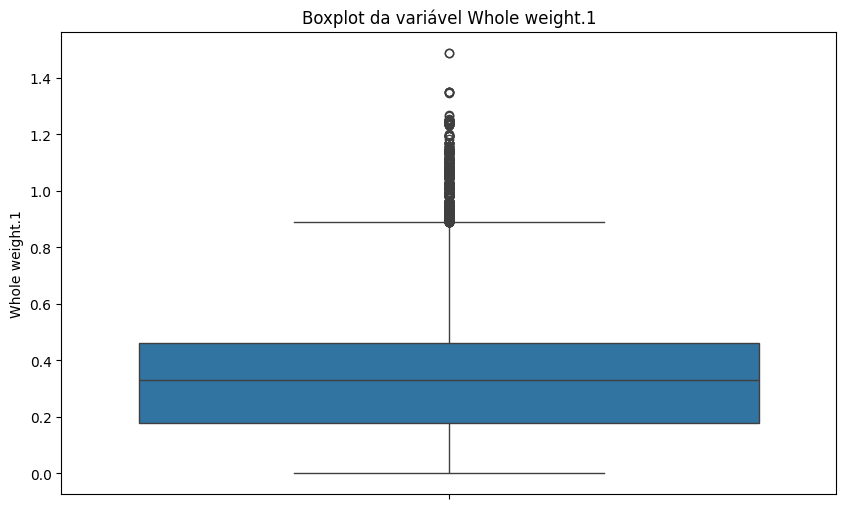

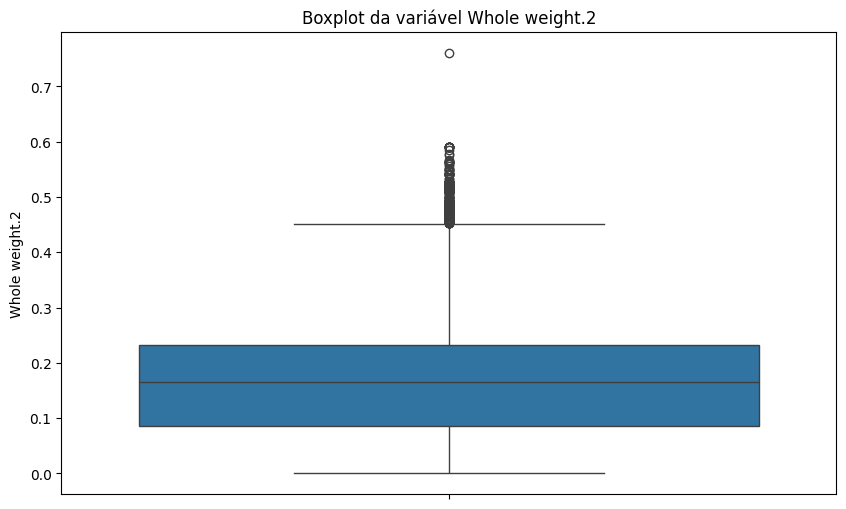

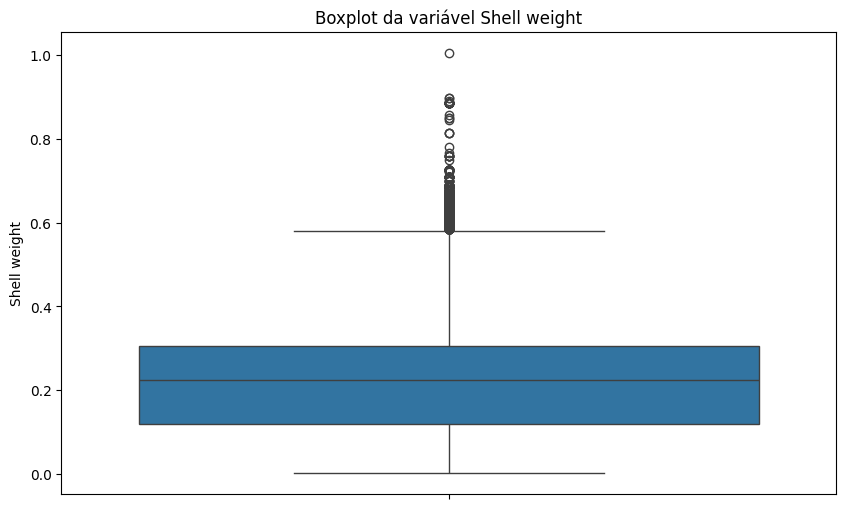

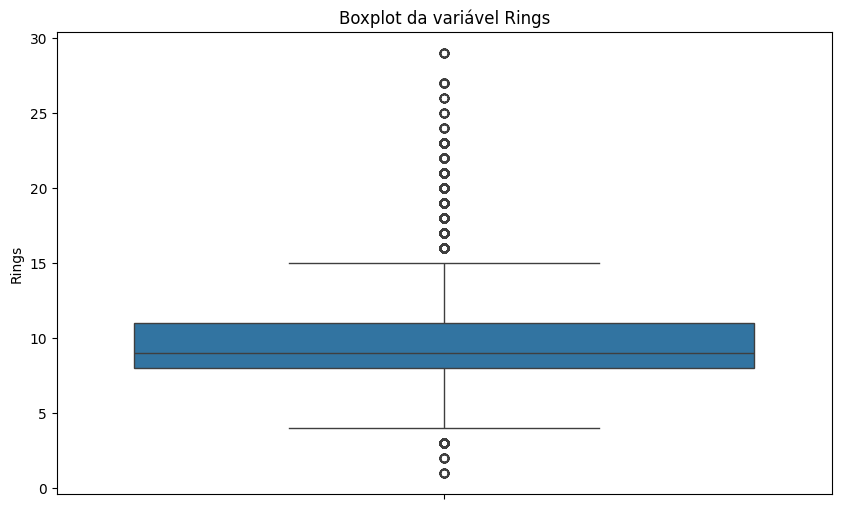

In [14]:
# Create a histogram for each quantitative feature
columns = ['Length', 'Diameter', 'Height', 'Whole weight',
           'Whole weight.1', 'Whole weight.2', 'Shell weight', 'Rings']



for col in columns:
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Gráfico de histograma usando Plotly Express
    fig_px = px.histogram(train, x=col, title=f'Histograma da variável {col}', nbins=100)
    fig_px.update_layout(showlegend=False)  # Remover legenda
    fig_px.update_traces(marker_color='blue')  # Personalizar cor
    fig_px.update_xaxes(title_text=col)  # Adicionar título ao eixo x
    fig_px.update_yaxes(title_text='Frequência')  # Adicionar título ao eixo y
    fig_px.show()
    
    # Gráfico de boxplot usando Seaborn
    sns.boxplot(data=train, y=col)
    plt.title(f'Boxplot da variável {col}')
    
    plt.show()


    

## Análise bivariada

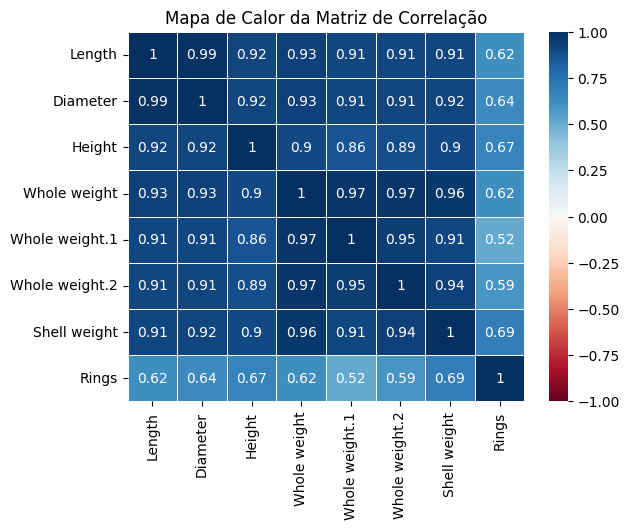

In [15]:
numerics = train.select_dtypes(include=np.number).drop(columns=['id'])
sns.heatmap(numerics.corr(), annot=True, vmin=-1, vmax=1, cmap='RdBu', linewidths=0.5)
plt.title('Mapa de Calor da Matriz de Correlação')
plt.show()

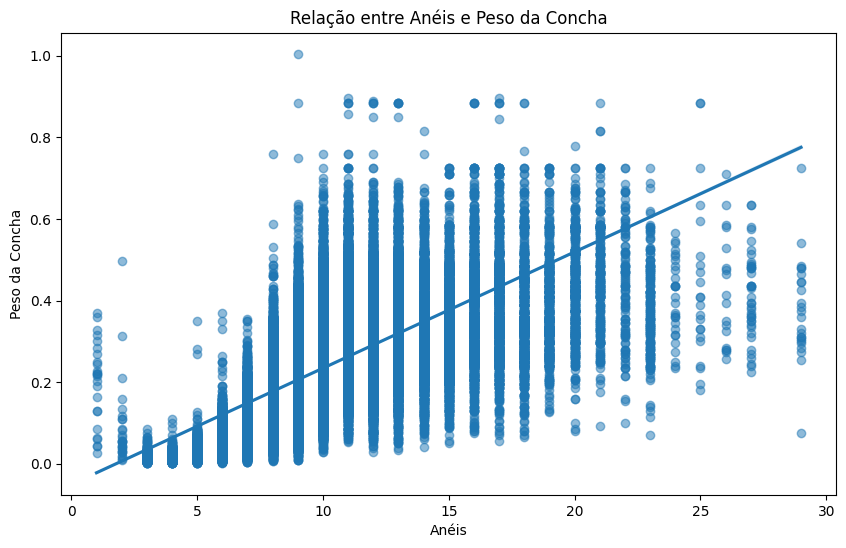

In [17]:
plt.figure(figsize = (10,6))
sns.regplot(x='Rings', y='Shell weight', data=train, scatter_kws={'alpha': 0.5})

plt.title(f'Relação entre Anéis e Peso da Concha')
plt.xlabel('Anéis')
plt.ylabel('Peso da Concha')

plt.show()

# Modelagem
Exclusão da variável ID, que não agregará ao nosso modelo

In [16]:
colunas_para_remover = ['id']
train.drop(columns=colunas_para_remover, inplace=True)
train

,Sex,Length,Diameter,Height,Whole weight,Whole weight.1,Whole weight.2,Shell weight,Rings
0,F,0.550,0.430,0.150,0.7715,0.3285,0.1465,0.2400,11
1,F,0.630,0.490,0.145,1.1300,0.4580,0.2765,0.3200,11
2,I,0.160,0.110,0.025,0.0210,0.0055,0.0030,0.0050,6
3,M,0.595,0.475,0.150,0.9145,0.3755,0.2055,0.2500,10
4,I,0.555,0.425,0.130,0.7820,0.3695,0.1600,0.1975,9
...,...,...,...,...,...,...,...,...,...
90610,M,0.335,0.235,0.075,0.1585,0.0685,0.0370,0.0450,6
90611,M,0.555,0.425,0.150,0.8790,0.3865,0.1815,0.2400,9
90612,I,0.435,0.330,0.095,0.3215,0.1510,0.0785,0.0815,6
90613,I,0.345,0.270,0.075,0.2000,0.0980,0.0490,0.0700,6


## One-hot encoding

In [17]:
train_ohe = pd.get_dummies(train, drop_first=True, dtype=float)
train_ohe

,Length,Diameter,Height,Whole weight,Whole weight.1,Whole weight.2,Shell weight,Rings,Sex_I,Sex_M
0,0.550,0.430,0.150,0.7715,0.3285,0.1465,0.2400,11,0.0,0.0
1,0.630,0.490,0.145,1.1300,0.4580,0.2765,0.3200,11,0.0,0.0
2,0.160,0.110,0.025,0.0210,0.0055,0.0030,0.0050,6,1.0,0.0
3,0.595,0.475,0.150,0.9145,0.3755,0.2055,0.2500,10,0.0,1.0
4,0.555,0.425,0.130,0.7820,0.3695,0.1600,0.1975,9,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...
90610,0.335,0.235,0.075,0.1585,0.0685,0.0370,0.0450,6,0.0,1.0
90611,0.555,0.425,0.150,0.8790,0.3865,0.1815,0.2400,9,0.0,1.0
90612,0.435,0.330,0.095,0.3215,0.1510,0.0785,0.0815,6,1.0,0.0
90613,0.345,0.270,0.075,0.2000,0.0980,0.0490,0.0700,6,1.0,0.0


### Divisão target

In [18]:
X = train_ohe.drop(columns = ['Rings'], axis = 1)
y = train_ohe.Rings

In [20]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

## Definição dos modelos

In [22]:
modelo_xgboost = XGBRegressor(n_estimators=1000, max_depth=8, learning_rate=1e-3, n_jobs=-1, random_state=0)

In [23]:
modelo_lightgbm = XGBRegressor(n_estimators=1000, max_depth=8, num_leaves=2^8, learning_rate=1e-3, n_jobs=-1, random_state=0)

In [24]:
modelo_catboost = CatBoostRegressor(n_estimators=1000, max_depth=8, learning_rate=1e-3, random_state=0, verbose=0)

In [25]:
modelo_decisiontree = DecisionTreeRegressor(min_samples_split=2, max_depth=8, random_state=0)

## Feature Importance

In [26]:
X_train_fi = X_train.copy()
X_test_fi = X_test.copy()

modelo_decisiontree.fit(X_train_fi, y_train)
r = permutation_importance(modelo_decisiontree, X_test_fi, y_test, n_repeats=30, random_state=0)


In [27]:
importances = pd.DataFrame({'feature': X_test_fi.columns, 'importance': r.importances_mean})
importances = importances.sort_values(by='importance', ascending=False)
importances

,feature,importance
6,Shell weight,2.087922
4,Whole weight.1,0.633188
5,Whole weight.2,0.224464
0,Length,0.075523
3,Whole weight,0.050012
2,Height,0.026288
7,Sex_I,0.022665
1,Diameter,0.007131
8,Sex_M,0.001063


### Feature Engineering

In [28]:
X_train_fi['Volume'] = X_train_fi['Length'] * X_train_fi['Diameter'] * X_train_fi['Height']
X_test_fi['Volume'] = X_test_fi['Length'] * X_test_fi['Diameter'] * X_test_fi['Height']
X_train_fi = X_train_fi.drop(columns = ['Length', 'Diameter', 'Height'])
X_test_fi = X_test_fi.drop(columns = ['Length', 'Diameter', 'Height'])

temp_df = X_train_fi.copy()
temp_df['Rings'] = y_train

average_rings_per_shell_weight = temp_df.groupby('Shell weight')['Rings'].mean()

X_train_fi['average_rings_per_shell_weight'] = X_train_fi['Shell weight'].map(average_rings_per_shell_weight)
X_test_fi['average_rings_per_shell_weight'] = X_test_fi['Shell weight'].map(average_rings_per_shell_weight)

average_rings_per_whole_weight1 = temp_df.groupby('Whole weight.1')['Rings'].mean()

X_train_fi['average_rings_per_whole_weight1'] = X_train_fi['Whole weight.1'].map(average_rings_per_whole_weight1)
X_test_fi['average_rings_per_whole_weight1'] = X_test_fi['Whole weight.1'].map(average_rings_per_whole_weight1)


In [29]:
modelo_decisiontree.fit(X_train_fi, y_train)
r_versao2 = permutation_importance(modelo_decisiontree, X_test_fi, y_test, n_repeats=30, random_state=0)

In [30]:
importances_2 = pd.DataFrame({'feature': X_test_fi.columns, 'importance': r_versao2.importances_mean})
importances_2 = importances_2.sort_values(by='importance', ascending=False)
importances_2

,feature,importance
7,average_rings_per_shell_weight,1.950531
1,Whole weight.1,0.798793
2,Whole weight.2,0.093016
0,Whole weight,0.048408
3,Shell weight,0.044083
6,Volume,0.019798
4,Sex_I,0.016874
8,average_rings_per_whole_weight1,0.003621
5,Sex_M,0.000000


## Validação Cruzada

In [31]:
def validacao_cruzada(X, y, modelo, k):
    
    folds = StratifiedKFold(n_splits=k, shuffle=True, random_state=0)

    erros_absolutos = list()
    erros_quadrados = list()
    r2 = list()
    erros_log = list()

    for k, (train_index, test_index) in enumerate(folds.split(X, y)):
        print('~*'*8 + f' Fold {k+1} ' + '*~'*8)

        X_train_intern, y_train_intern = X.iloc[train_index, :], y.iloc[train_index]
        X_test_intern, y_test_intern = X.iloc[test_index, :], y.iloc[test_index]
        
        num_imputer = SimpleImputer(strategy='median')

        num_pipeline = Pipeline([('imputer', num_imputer)])
        num_cols = X_train_intern.select_dtypes(exclude = ['object']).columns
        
        X_train_intern[num_cols] = num_pipeline.fit_transform(X_train_intern[num_cols])
        X_test_intern[num_cols] = num_pipeline.transform(X_test_intern[num_cols])
        
        modelo.fit(X_train_intern, y_train_intern)

        y_pred = modelo.predict(X_test_intern)

        r2score = r2_score(y_test_intern, y_pred)
        mse = mean_squared_error(y_test_intern, y_pred)
        mae = mean_absolute_error(y_test_intern, y_pred)
        rmsle = np.sqrt(mean_squared_log_error(1 + y_test_intern, 1 + y_pred))

        erros_absolutos.append(mae)
        erros_quadrados.append(mse)
        r2.append(r2score)
        erros_log.append(rmsle)

        print(f'MAE: {mae:.3f}')
        print(f'MSE: {mse:.3f}')
        print(f'R2: {r2score:.3f}')
        print(f'RMLSE: {rmsle:.5f}')

    erros_absolutos = np.array(erros_absolutos)
    erros_quadrados = np.array(erros_quadrados)
    r2 = np.array(r2)
    erros_log = np.array(erros_log)

    media_mae = np.mean(erros_absolutos)
    media_mse = np.mean(erros_quadrados)
    media_r2 = np.mean(r2)
    media_rmsle = np.mean(erros_log)

    std_mae = np.std(erros_absolutos)
    std_mse = np.std(erros_quadrados)
    std_r2 = np.std(r2)
    std_rmsle = np.std(erros_log)

    print()
    print('~*'*3 + ' Exibindo a média e desvio padrão das métricas obtidas ' + '*~'*3)
    print(f'Média do Erro Médio Absoluto: {media_mae:.3f} +/- {std_mae:.3f}')
    print(f'Média do Erro Quadrático Médio: {media_mse:.3f} +/- {std_mse:.3f}')
    print(f'Média do R-Quadrado: {media_r2:.3f} +/- {std_r2:.3f}')
    print(f'Média do Erro Logarítmico Quadrático Médio: {media_rmsle:.5f} +/- {std_rmsle:.5f}')

### XGBoost

In [32]:
validacao_cruzada(X, y, modelo_xgboost, k=5)

~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~


MAE: 1.463
MSE: 4.456
R2: 0.558
RMLSE: 0.16396
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
MAE: 1.458
MSE: 4.414
R2: 0.562
RMLSE: 0.16288
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
MAE: 1.461
MSE: 4.440
R2: 0.561
RMLSE: 0.16351
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
MAE: 1.462
MSE: 4.437
R2: 0.560
RMLSE: 0.16393
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~
MAE: 1.468
MSE: 4.478
R2: 0.556
RMLSE: 0.16412

~*~*~* Exibindo a média e desvio padrão das métricas obtidas *~*~*~
Média do Erro Médio Absoluto: 1.462 +/- 0.003
Média do Erro Quadrático Médio: 4.445 +/- 0.021
Média do R-Quadrado: 0.559 +/- 0.002
Média do Erro Logarítmico Quadrático Médio: 0.16368 +/- 0.00045


### LightGBM

In [33]:
validacao_cruzada(X, y, modelo_lightgbm, k=5)

~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
MAE: 1.463
MSE: 4.456
R2: 0.558
RMLSE: 0.16396
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
MAE: 1.458
MSE: 4.414
R2: 0.562
RMLSE: 0.16288
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
MAE: 1.461
MSE: 4.440
R2: 0.561
RMLSE: 0.16351
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
MAE: 1.462
MSE: 4.437
R2: 0.560
RMLSE: 0.16393
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~
MAE: 1.468
MSE: 4.478
R2: 0.556
RMLSE: 0.16412

~*~*~* Exibindo a média e desvio padrão das métricas obtidas *~*~*~
Média do Erro Médio Absoluto: 1.462 +/- 0.003
Média do Erro Quadrático Médio: 4.445 +/- 0.021
Média do R-Quadrado: 0.559 +/- 0.002
Média do Erro Logarítmico Quadrático Médio: 0.16368 +/- 0.00045


### CatBoost

In [34]:
validacao_cruzada(X, y, modelo_catboost, k=5)

~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
MAE: 1.559
MSE: 5.047
R2: 0.499
RMLSE: 0.17402
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
MAE: 1.552
MSE: 4.972
R2: 0.506
RMLSE: 0.17281
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
MAE: 1.562
MSE: 5.034
R2: 0.502
RMLSE: 0.17372
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
MAE: 1.559
MSE: 5.023
R2: 0.502
RMLSE: 0.17396
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~
MAE: 1.566
MSE: 5.057
R2: 0.499
RMLSE: 0.17402

~*~*~* Exibindo a média e desvio padrão das métricas obtidas *~*~*~
Média do Erro Médio Absoluto: 1.559 +/- 0.005
Média do Erro Quadrático Médio: 5.027 +/- 0.030
Média do R-Quadrado: 0.502 +/- 0.003
Média do Erro Logarítmico Quadrático Médio: 0.17371 +/- 0.00046


### Decision Tree

In [35]:
validacao_cruzada(X, y, modelo_decisiontree, k=5)

~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
MAE: 1.310
MSE: 3.820
R2: 0.621
RMLSE: 0.14476
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
MAE: 1.300
MSE: 3.768
R2: 0.626
RMLSE: 0.14285
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
MAE: 1.307
MSE: 3.804
R2: 0.624
RMLSE: 0.14426
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
MAE: 1.301
MSE: 3.737
R2: 0.630
RMLSE: 0.14361
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~
MAE: 1.303
MSE: 3.795
R2: 0.624
RMLSE: 0.14365

~*~*~* Exibindo a média e desvio padrão das métricas obtidas *~*~*~
Média do Erro Médio Absoluto: 1.304 +/- 0.004
Média do Erro Quadrático Médio: 3.785 +/- 0.029
Média do R-Quadrado: 0.625 +/- 0.003
Média do Erro Logarítmico Quadrático Médio: 0.14383 +/- 0.00065


## Tunagem de hiperparâmetros

In [36]:
def tunagem_hiperparametros(trial, k=5):
    
    max_depth = trial.suggest_int('max_depth', 1, 32)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)
    
    folds = StratifiedKFold(n_splits=k, shuffle=True, random_state=0)

    erros_absolutos = list()
    erros_quadrados = list()
    r2 = list()
    erros_log = list()

    for k, (train_index, test_index) in enumerate(folds.split(X, y)):
        print('~*'*8 + f' Fold {k+1} ' + '*~'*8)

        X_train_intern, y_train_intern = X.iloc[train_index, :], y.iloc[train_index]
        X_test_intern, y_test_intern = X.iloc[test_index, :], y.iloc[test_index]

        num_imputer = SimpleImputer(strategy='median')
        num_pipeline = Pipeline([('imputer', num_imputer)])
        num_cols = X_train_intern.select_dtypes(exclude = ['object']).columns
        
        X_train_intern[num_cols] = num_pipeline.fit_transform(X_train_intern[num_cols])
        X_test_intern[num_cols] = num_pipeline.transform(X_test_intern[num_cols])

        modelo_decisiontree = DecisionTreeRegressor(min_samples_split=min_samples_split, max_depth=max_depth, random_state=min_samples_leaf)
        
        modelo_decisiontree.fit(X_train_intern, y_train_intern)

        y_pred = modelo_decisiontree.predict(X_test_intern)

        r2score = r2_score(y_test_intern, y_pred)
        mse = mean_squared_error(y_test_intern, y_pred)
        mae = mean_absolute_error(y_test_intern, y_pred)
        rmsle = np.sqrt(mean_squared_log_error(1 + y_test_intern, 1 + y_pred))

        erros_absolutos.append(mae)
        erros_quadrados.append(mse)
        r2.append(r2score)
        erros_log.append(rmsle)

    erros_absolutos = np.array(erros_absolutos)
    erros_quadrados = np.array(erros_quadrados)
    r2 = np.array(r2)
    erros_log = np.array(erros_log)

    media_mae = np.mean(erros_absolutos)
    media_mse = np.mean(erros_quadrados)
    media_r2 = np.mean(r2)
    media_rmsle = np.mean(erros_log)

    std_mae = np.std(erros_absolutos)
    std_mse = np.std(erros_quadrados)
    std_r2 = np.std(r2)
    std_rmsle = np.std(erros_log)

    return media_rmsle

study = opt.create_study(direction = 'minimize')
study.optimize(tunagem_hiperparametros, n_trials=50)

[I 2024-04-17 19:45:15,420] A new study created in memory with name: no-name-0ae2fbdc-dd53-4e15-8fdd-0634fc862676


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:16,089] Trial 0 finished with value: 0.1554811097991581 and parameters: {'max_depth': 4, 'min_samples_split': 18, 'min_samples_leaf': 16}. Best is trial 0 with value: 0.1554811097991581.


~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:17,805] Trial 1 finished with value: 0.16381068980798424 and parameters: {'max_depth': 18, 'min_samples_split': 15, 'min_samples_leaf': 1}. Best is trial 0 with value: 0.1554811097991581.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:18,864] Trial 2 finished with value: 0.1442601237145832 and parameters: {'max_depth': 9, 'min_samples_split': 6, 'min_samples_leaf': 16}. Best is trial 2 with value: 0.1442601237145832.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:20,629] Trial 3 finished with value: 0.16419029857001885 and parameters: {'max_depth': 20, 'min_samples_split': 18, 'min_samples_leaf': 18}. Best is trial 2 with value: 0.1442601237145832.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:22,612] Trial 4 finished with value: 0.18508935942511434 and parameters: {'max_depth': 21, 'min_samples_split': 4, 'min_samples_leaf': 15}. Best is trial 2 with value: 0.1442601237145832.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:24,204] Trial 5 finished with value: 0.16127101999347088 and parameters: {'max_depth': 16, 'min_samples_split': 12, 'min_samples_leaf': 15}. Best is trial 2 with value: 0.1442601237145832.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:26,288] Trial 6 finished with value: 0.19034133405808334 and parameters: {'max_depth': 25, 'min_samples_split': 4, 'min_samples_leaf': 4}. Best is trial 2 with value: 0.1442601237145832.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:27,021] Trial 7 finished with value: 0.1499103394216746 and parameters: {'max_depth': 5, 'min_samples_split': 5, 'min_samples_leaf': 15}. Best is trial 2 with value: 0.1442601237145832.


~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:27,771] Trial 8 finished with value: 0.1499103394216746 and parameters: {'max_depth': 5, 'min_samples_split': 3, 'min_samples_leaf': 3}. Best is trial 2 with value: 0.1442601237145832.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:29,673] Trial 9 finished with value: 0.17681711442408982 and parameters: {'max_depth': 21, 'min_samples_split': 8, 'min_samples_leaf': 3}. Best is trial 2 with value: 0.1442601237145832.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:30,988] Trial 10 finished with value: 0.15015221738607032 and parameters: {'max_depth': 12, 'min_samples_split': 9, 'min_samples_leaf': 10}. Best is trial 2 with value: 0.1442601237145832.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:32,149] Trial 11 finished with value: 0.14527996889555386 and parameters: {'max_depth': 10, 'min_samples_split': 7, 'min_samples_leaf': 11}. Best is trial 2 with value: 0.1442601237145832.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:33,387] Trial 12 finished with value: 0.14756277375099522 and parameters: {'max_depth': 11, 'min_samples_split': 8, 'min_samples_leaf': 10}. Best is trial 2 with value: 0.1442601237145832.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:34,621] Trial 13 finished with value: 0.1471913022499281 and parameters: {'max_depth': 11, 'min_samples_split': 11, 'min_samples_leaf': 12}. Best is trial 2 with value: 0.1442601237145832.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:36,721] Trial 14 finished with value: 0.18634495887169528 and parameters: {'max_depth': 29, 'min_samples_split': 6, 'min_samples_leaf': 8}. Best is trial 2 with value: 0.1442601237145832.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:37,153] Trial 15 finished with value: 0.2014338207731523 and parameters: {'max_depth': 1, 'min_samples_split': 2, 'min_samples_leaf': 19}. Best is trial 2 with value: 0.1442601237145832.


~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:38,200] Trial 16 finished with value: 0.14413663278175537 and parameters: {'max_depth': 9, 'min_samples_split': 12, 'min_samples_leaf': 7}. Best is trial 16 with value: 0.14413663278175537.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:39,205] Trial 17 finished with value: 0.14372380912780264 and parameters: {'max_depth': 8, 'min_samples_split': 14, 'min_samples_leaf': 8}. Best is trial 17 with value: 0.14372380912780264.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:40,758] Trial 18 finished with value: 0.15708578123921682 and parameters: {'max_depth': 15, 'min_samples_split': 15, 'min_samples_leaf': 6}. Best is trial 17 with value: 0.14372380912780264.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:41,765] Trial 19 finished with value: 0.14367975831622987 and parameters: {'max_depth': 8, 'min_samples_split': 15, 'min_samples_leaf': 7}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:42,288] Trial 20 finished with value: 0.17634808407834085 and parameters: {'max_depth': 2, 'min_samples_split': 20, 'min_samples_leaf': 5}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:43,202] Trial 21 finished with value: 0.14439734107763325 and parameters: {'max_depth': 7, 'min_samples_split': 13, 'min_samples_leaf': 7}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:44,653] Trial 22 finished with value: 0.1545067511658384 and parameters: {'max_depth': 14, 'min_samples_split': 15, 'min_samples_leaf': 8}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:45,636] Trial 23 finished with value: 0.143714428055764 and parameters: {'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 9}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:46,554] Trial 24 finished with value: 0.14440167885202285 and parameters: {'max_depth': 7, 'min_samples_split': 17, 'min_samples_leaf': 12}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:47,547] Trial 25 finished with value: 0.14441920317147783 and parameters: {'max_depth': 7, 'min_samples_split': 14, 'min_samples_leaf': 9}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:48,938] Trial 26 finished with value: 0.1531475681652254 and parameters: {'max_depth': 13, 'min_samples_split': 10, 'min_samples_leaf': 13}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:49,549] Trial 27 finished with value: 0.16495706598962528 and parameters: {'max_depth': 3, 'min_samples_split': 17, 'min_samples_leaf': 6}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:50,455] Trial 28 finished with value: 0.14443050340234348 and parameters: {'max_depth': 7, 'min_samples_split': 13, 'min_samples_leaf': 9}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:51,138] Trial 29 finished with value: 0.1554811097991581 and parameters: {'max_depth': 4, 'min_samples_split': 20, 'min_samples_leaf': 1}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:52,841] Trial 30 finished with value: 0.16311532856962482 and parameters: {'max_depth': 18, 'min_samples_split': 16, 'min_samples_leaf': 13}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:53,822] Trial 31 finished with value: 0.14370704954849747 and parameters: {'max_depth': 8, 'min_samples_split': 12, 'min_samples_leaf': 7}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:54,869] Trial 32 finished with value: 0.14407647403201035 and parameters: {'max_depth': 9, 'min_samples_split': 14, 'min_samples_leaf': 8}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:55,712] Trial 33 finished with value: 0.14623752677383076 and parameters: {'max_depth': 6, 'min_samples_split': 11, 'min_samples_leaf': 5}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:56,790] Trial 34 finished with value: 0.14409611111119094 and parameters: {'max_depth': 9, 'min_samples_split': 14, 'min_samples_leaf': 6}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:58,155] Trial 35 finished with value: 0.1515515239631172 and parameters: {'max_depth': 13, 'min_samples_split': 16, 'min_samples_leaf': 9}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:45:58,739] Trial 36 finished with value: 0.16495706598962528 and parameters: {'max_depth': 3, 'min_samples_split': 13, 'min_samples_leaf': 7}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:46:00,726] Trial 37 finished with value: 0.17462065224990522 and parameters: {'max_depth': 32, 'min_samples_split': 12, 'min_samples_leaf': 11}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:46:02,371] Trial 38 finished with value: 0.16014279180385257 and parameters: {'max_depth': 17, 'min_samples_split': 18, 'min_samples_leaf': 4}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:46:04,305] Trial 39 finished with value: 0.17554520724592781 and parameters: {'max_depth': 23, 'min_samples_split': 10, 'min_samples_leaf': 2}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:46:05,288] Trial 40 finished with value: 0.14368797556006152 and parameters: {'max_depth': 8, 'min_samples_split': 15, 'min_samples_leaf': 5}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:46:06,271] Trial 41 finished with value: 0.14368797556006152 and parameters: {'max_depth': 8, 'min_samples_split': 15, 'min_samples_leaf': 5}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:46:07,024] Trial 42 finished with value: 0.1499103394216746 and parameters: {'max_depth': 5, 'min_samples_split': 16, 'min_samples_leaf': 4}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:46:08,238] Trial 43 finished with value: 0.14685831055968318 and parameters: {'max_depth': 11, 'min_samples_split': 15, 'min_samples_leaf': 5}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:46:09,371] Trial 44 finished with value: 0.14487915977479393 and parameters: {'max_depth': 10, 'min_samples_split': 18, 'min_samples_leaf': 3}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:46:10,133] Trial 45 finished with value: 0.1499103394216746 and parameters: {'max_depth': 5, 'min_samples_split': 17, 'min_samples_leaf': 6}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:46:11,405] Trial 46 finished with value: 0.1485995153932055 and parameters: {'max_depth': 12, 'min_samples_split': 19, 'min_samples_leaf': 2}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:46:12,388] Trial 47 finished with value: 0.14371494399571133 and parameters: {'max_depth': 8, 'min_samples_split': 13, 'min_samples_leaf': 5}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:46:12,823] Trial 48 finished with value: 0.2014338207731523 and parameters: {'max_depth': 1, 'min_samples_split': 10, 'min_samples_leaf': 10}. Best is trial 19 with value: 0.14367975831622987.


~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~


[I 2024-04-17 19:46:13,966] Trial 49 finished with value: 0.14506069314460282 and parameters: {'max_depth': 10, 'min_samples_split': 11, 'min_samples_leaf': 4}. Best is trial 19 with value: 0.14367975831622987.


In [37]:
params = study.best_params
modelo_decisiontree = DecisionTreeRegressor(**params)
validacao_cruzada(X, y, modelo_decisiontree, k=5)

~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
MAE: 1.308
MSE: 3.801
R2: 0.623
RMLSE: 0.14455
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
MAE: 1.297
MSE: 3.725
R2: 0.630
RMLSE: 0.14234
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
MAE: 1.300
MSE: 3.728
R2: 0.631
RMLSE: 0.14330
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
MAE: 1.298
MSE: 3.702
R2: 0.633
RMLSE: 0.14308
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~
MAE: 1.299
MSE: 3.751
R2: 0.628
RMLSE: 0.14304

~*~*~* Exibindo a média e desvio padrão das métricas obtidas *~*~*~
Média do Erro Médio Absoluto: 1.300 +/- 0.004
Média do Erro Quadrático Médio: 3.741 +/- 0.034
Média do R-Quadrado: 0.629 +/- 0.004
Média do Erro Logarítmico Quadrático Médio: 0.14326 +/- 0.00072


### Feature Engineering

In [58]:
X.columns

Index(['Length', 'Diameter', 'Height', 'Whole weight', 'Whole weight.1',
       'Whole weight.2', 'Shell weight', 'Sex_I', 'Sex_M'],
      dtype='object')

In [76]:
def feature_engineering(X, avg_rings):
    
    X['average_rings_per_shell_weight'] = X['Shell weight'].map(avg_rings)
    X['Volume'] = X['Length'] * X['Diameter'] * X['Height']

    return X

In [77]:
def validacao_cruzada_feature_engineering(X, y, modelo, k):
    
    folds = StratifiedKFold(n_splits=k, shuffle=True, random_state=0)

    erros_absolutos = list()
    erros_quadrados = list()
    r2 = list()
    erros_log = list()

    for k, (train_index, test_index) in enumerate(folds.split(X, y)):
        print('~*'*8 + f' Fold {k+1} ' + '*~'*8)

        X_train_intern, y_train_intern = X.iloc[train_index, :], y.iloc[train_index]
        X_test_intern, y_test_intern = X.iloc[test_index, :], y.iloc[test_index] 

        num_imputer = SimpleImputer(strategy='median')

        num_pipeline = Pipeline([('imputer', num_imputer)])
        
        ############### FEATURE ENGINEERING #################

        avg_rings = X_train_intern.copy()
        avg_rings['Rings'] = y_train_intern

        avg_rings = avg_rings.groupby('Shell weight')['Rings'].mean()

        X_train_intern = feature_engineering(X_train_intern, avg_rings)
        X_test_intern = feature_engineering(X_test_intern, avg_rings)

        #####################################################

        num_cols = X_train_intern.select_dtypes(exclude = ['object']).columns
        
        X_train_intern[num_cols] = num_pipeline.fit_transform(X_train_intern[num_cols])
        X_test_intern[num_cols] = num_pipeline.transform(X_test_intern[num_cols])
        
        modelo.fit(X_train_intern, y_train_intern)

        y_pred = modelo.predict(X_test_intern)

        r2score = r2_score(y_test_intern, y_pred)
        mse = mean_squared_error(y_test_intern, y_pred)
        mae = mean_absolute_error(y_test_intern, y_pred)
        rmsle = np.sqrt(mean_squared_log_error(1 + y_test_intern, 1 + y_pred))

        erros_absolutos.append(mae)
        erros_quadrados.append(mse)
        r2.append(r2score)
        erros_log.append(rmsle)

        print(f'MAE: {mae:.3f}')
        print(f'MSE: {mse:.3f}')
        print(f'R2: {r2score:.3f}')
        print(f'RMLSE: {rmsle:.5f}')

    erros_absolutos = np.array(erros_absolutos)
    erros_quadrados = np.array(erros_quadrados)
    r2 = np.array(r2)
    erros_log = np.array(erros_log)

    media_mae = np.mean(erros_absolutos)
    media_mse = np.mean(erros_quadrados)
    media_r2 = np.mean(r2)
    media_rmsle = np.mean(erros_log)

    std_mae = np.std(erros_absolutos)
    std_mse = np.std(erros_quadrados)
    std_r2 = np.std(r2)
    std_rmsle = np.std(erros_log)

    print()
    print('~*'*3 + ' Exibindo a média e desvio padrão das métricas obtidas ' + '*~'*3)
    print(f'Média do Erro Médio Absoluto: {media_mae:.3f} +/- {std_mae:.3f}')
    print(f'Média do Erro Quadrático Médio: {media_mse:.3f} +/- {std_mse:.3f}')
    print(f'Média do R-Quadrado: {media_r2:.3f} +/- {std_r2:.3f}')
    print(f'Média do Erro Logarítmico Quadrático Médio: {media_rmsle:.5f} +/- {std_rmsle:.5f}')

In [78]:
validacao_cruzada_feature_engineering(X, y, modelo_decisiontree, k=5)

~*~*~*~*~*~*~*~* Fold 1 *~*~*~*~*~*~*~*~
MAE: 1.310
MSE: 3.767
R2: 0.626
RMLSE: 0.14401
~*~*~*~*~*~*~*~* Fold 2 *~*~*~*~*~*~*~*~
MAE: 1.300
MSE: 3.724
R2: 0.630
RMLSE: 0.14264
~*~*~*~*~*~*~*~* Fold 3 *~*~*~*~*~*~*~*~
MAE: 1.291
MSE: 3.648
R2: 0.639
RMLSE: 0.14211
~*~*~*~*~*~*~*~* Fold 4 *~*~*~*~*~*~*~*~
MAE: 1.288
MSE: 3.655
R2: 0.638
RMLSE: 0.14223
~*~*~*~*~*~*~*~* Fold 5 *~*~*~*~*~*~*~*~
MAE: 1.301
MSE: 3.728
R2: 0.631
RMLSE: 0.14258

~*~*~* Exibindo a média e desvio padrão das métricas obtidas *~*~*~
Média do Erro Médio Absoluto: 1.298 +/- 0.008
Média do Erro Quadrático Médio: 3.705 +/- 0.046
Média do R-Quadrado: 0.633 +/- 0.005
Média do Erro Logarítmico Quadrático Médio: 0.14271 +/- 0.00068


In [41]:
test_ohe = pd.get_dummies(test, drop_first=True, dtype=float)
test_ohe

,id,Length,Diameter,Height,Whole weight,Whole weight.1,Whole weight.2,Shell weight,Sex_I,Sex_M
0,90615,0.645,0.475,0.155,1.2380,0.6185,0.3125,0.3005,0.0,1.0
1,90616,0.580,0.460,0.160,0.9830,0.4785,0.2195,0.2750,0.0,1.0
2,90617,0.560,0.420,0.140,0.8395,0.3525,0.1845,0.2405,0.0,1.0
3,90618,0.570,0.490,0.145,0.8740,0.3525,0.1865,0.2350,0.0,1.0
4,90619,0.415,0.325,0.110,0.3580,0.1575,0.0670,0.1050,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...
60406,151021,0.345,0.260,0.085,0.1775,0.0735,0.0265,0.0500,1.0,0.0
60407,151022,0.525,0.410,0.145,0.8445,0.3885,0.1670,0.2050,0.0,0.0
60408,151023,0.590,0.440,0.155,1.1220,0.3930,0.2000,0.2650,1.0,0.0
60409,151024,0.660,0.525,0.190,1.4935,0.5885,0.3575,0.4350,0.0,0.0


In [48]:
test_fe = test_ohe.copy()
test_fe = test_fe.drop(columns='id')
avg_rings = X.copy()
avg_rings['Rings'] = y

avg_rings = avg_rings.groupby('Shell weight')['Rings'].mean()

test_fe = feature_engineering(test_fe, avg_rings)

In [49]:
test_fe

,Length,Diameter,Height,Whole weight,Whole weight.1,Whole weight.2,Shell weight,Sex_I,Sex_M,average_rings_per_shell_weight,Volume
0,0.645,0.475,0.155,1.2380,0.6185,0.3125,0.3005,0.0,1.0,10.181818,0.047488
1,0.580,0.460,0.160,0.9830,0.4785,0.2195,0.2750,0.0,1.0,11.269199,0.042688
2,0.560,0.420,0.140,0.8395,0.3525,0.1845,0.2405,0.0,1.0,9.576471,0.032928
3,0.570,0.490,0.145,0.8740,0.3525,0.1865,0.2350,0.0,1.0,11.061021,0.040498
4,0.415,0.325,0.110,0.3580,0.1575,0.0670,0.1050,1.0,0.0,7.859259,0.014836
...,...,...,...,...,...,...,...,...,...,...,...
60406,0.345,0.260,0.085,0.1775,0.0735,0.0265,0.0500,1.0,0.0,6.491094,0.007625
60407,0.525,0.410,0.145,0.8445,0.3885,0.1670,0.2050,0.0,0.0,10.788494,0.031211
60408,0.590,0.440,0.155,1.1220,0.3930,0.2000,0.2650,1.0,0.0,10.919167,0.040238
60409,0.660,0.525,0.190,1.4935,0.5885,0.3575,0.4350,0.0,0.0,13.559557,0.065835


## Geração das predições para o *sample_submission*

In [53]:
# Generate predictions using the trained Random Forest model
predictions_dt = modelo_decisiontree.predict(test_fe)

# Print the predictions
display(predictions_dt)

array([10.42056555,  9.75476992, 10.19224556, ..., 11.55218447,
       12.33688415,  8.00668151])

In [55]:
sample_submission['Rings'] = predictions_dt
sample_submission

,id,Rings
0,90615,10.420566
1,90616,9.754770
2,90617,10.192246
3,90618,11.460340
4,90619,7.981087
...,...,...
60406,151021,6.428889
60407,151022,9.836717
60408,151023,11.552184
60409,151024,12.336884


In [56]:
sample_submission.to_csv('submission1.csv', index=False)